## StyleGan Transfer Learning for Pokémon


- Using NVIDIA StyleGan: https://github.com/NVlabs/stylegan
- Reference Child-art project: https://github.com/roberttwomey/child-art/blob/master/stylegan-finetune.ipynb

In [1]:
import tensorflow as tf
tf.__version__

'1.14.0'

In [2]:
!pip list | grep tensorflow-estimator

tensorflow-estimator           1.14.0      


In [3]:
# !pip install --upgrade --user tensorflow-gpu==1.15.1

In [4]:
# !pip install --upgrade --user tensorflow-estimator==1.14

In [5]:
# !git clone https://github.com/NVlabs/stylegan.git

In [3]:
cd stylegan

/home/yul884/dsc160-code/final_proj/stylegan


## Data Setup

download dataset

In [ ]:
# dataset comes from this kaggle link: https://www.kaggle.com/kvpratama/pokemon-images-dataset#101.png

# make sure that each of these .png files are uploaded into the correct directory in order to access properly
# In our case, our directory for our pokemon data was located in '/home/yul884/dsc160-code/final_proj/stylegan/pokemon'

download latest model for transfer learning

In [1]:
# Run this cell only once the first time

# !wget -nc http://roberttwomey.com/downloads/network-snapshot-011125.pkl

# Preprocessing images data

In [ ]:
# note that the images must be RGB type and 512 x 512 dimensions for the code to work

In [ ]:
# This cell is useful for converting images to PNG and dimension 512 x 512

# import Augmentor
# p = Augmentor.Pipeline('/home/yul884/dsc160-code/final_proj/stylegan/pokemon', '/home/yul884/dsc160-code/final_proj/stylegan/pokemon_updated', save_format="PNG")
# p.resize(probability=1.0, width=512, height=512)

# p.process()

generate tfrecords

In [11]:
# make sure to chance directory correctly 

# note that for our implementation we had to edit the dataset_tool.py file in order to accomodate our dataset

!python dataset_tool.py create_from_images datasets/final_imgs/ pokemon_updated/




Loading images from "pokemon_updated/"
Creating dataset "datasets/final_imgs/"



Added 819 images.                       


In [17]:
pwd

'/home/yul884/dsc160-code/final_proj/stylegan'

## Setup Training Script

In [21]:
cd training/

/home/yul884/dsc160-code/final_proj/stylegan/training


In [22]:
pwd

'/home/yul884/dsc160-code/final_proj/stylegan/training'

In [23]:
# !pip install dnn --user

In [24]:
%%writefile training_loop.py 
# Copyright (c) 2019, NVIDIA CORPORATION. All rights reserved.
#
# This work is licensed under the Creative Commons Attribution-NonCommercial
# 4.0 International License. To view a copy of this license, visit
# http://creativecommons.org/licenses/by-nc/4.0/ or send a letter to
# Creative Commons, PO Box 1866, Mountain View, CA 94042, USA.

"""Main training script."""

import os
import numpy as np
import tensorflow as tf
import dnnlib
import dnnlib.tflib as tflib
from dnnlib.tflib.autosummary import autosummary

import config
import train
from training import dataset
from training import misc
from metrics import metric_base


#----------------------------------------------------------------------------
# Just-in-time processing of training images before feeding them to the networks.

def process_reals(x, lod, mirror_augment, drange_data, drange_net):
    with tf.name_scope('ProcessReals'):
        with tf.name_scope('DynamicRange'):
            x = tf.cast(x, tf.float32)
            x = misc.adjust_dynamic_range(x, drange_data, drange_net)
        if mirror_augment:
            with tf.name_scope('MirrorAugment'):
                s = tf.shape(x)
                mask = tf.random_uniform([s[0], 1, 1, 1], 0.0, 1.0)
                mask = tf.tile(mask, [1, s[1], s[2], s[3]])
                x = tf.where(mask < 0.5, x, tf.reverse(x, axis=[3]))
        with tf.name_scope('FadeLOD'): # Smooth crossfade between consecutive levels-of-detail.
            s = tf.shape(x)
            y = tf.reshape(x, [-1, s[1], s[2]//2, 2, s[3]//2, 2])
            y = tf.reduce_mean(y, axis=[3, 5], keepdims=True)
            y = tf.tile(y, [1, 1, 1, 2, 1, 2])
            y = tf.reshape(y, [-1, s[1], s[2], s[3]])
            x = tflib.lerp(x, y, lod - tf.floor(lod))
        with tf.name_scope('UpscaleLOD'): # Upscale to match the expected input/output size of the networks.
            s = tf.shape(x)
            factor = tf.cast(2 ** tf.floor(lod), tf.int32)
            x = tf.reshape(x, [-1, s[1], s[2], 1, s[3], 1])
            x = tf.tile(x, [1, 1, 1, factor, 1, factor])
            x = tf.reshape(x, [-1, s[1], s[2] * factor, s[3] * factor])
        return x

#----------------------------------------------------------------------------
# Evaluate time-varying training parameters.

def training_schedule(
    cur_nimg,
    training_set,
    num_gpus, 
#     num_gpus = 2, 
    lod_initial_resolution  = 4,        # Image resolution used at the beginning.
    lod_training_kimg       = 600,      # Thousands of real images to show before doubling the resolution.
    lod_transition_kimg     = 600,      # Thousands of real images to show when fading in new layers.
    minibatch_base          = 16,       # Maximum minibatch size, divided evenly among GPUs.
    minibatch_dict          = {},       # Resolution-specific overrides.
    max_minibatch_per_gpu   = {},       # Resolution-specific maximum minibatch size per GPU.
    G_lrate_base            = 0.001,    # Learning rate for the generator.
    G_lrate_dict            = {},       # Resolution-specific overrides.
    D_lrate_base            = 0.001,    # Learning rate for the discriminator.
    D_lrate_dict            = {},       # Resolution-specific overrides.
    lrate_rampup_kimg       = 0,        # Duration of learning rate ramp-up.
    tick_kimg_base          = 160,      # Default interval of progress snapshots.
    tick_kimg_dict          = {4: 160, 8:140, 16:120, 32:100, 64:80, 128:60, 256:40, 512:30, 1024:20}): # Resolution-specific overrides.

    # Initialize result dict.
    s = dnnlib.EasyDict()
    s.kimg = cur_nimg / 1000.0

    # Training phase.
    phase_dur = lod_training_kimg + lod_transition_kimg
    phase_idx = int(np.floor(s.kimg / phase_dur)) if phase_dur > 0 else 0
    phase_kimg = s.kimg - phase_idx * phase_dur

    # Level-of-detail and resolution.
    s.lod = training_set.resolution_log2
    s.lod -= np.floor(np.log2(lod_initial_resolution))
    s.lod -= phase_idx
    if lod_transition_kimg > 0:
        s.lod -= max(phase_kimg - lod_training_kimg, 0.0) / lod_transition_kimg
    s.lod = max(s.lod, 0.0)
    s.resolution = 2 ** (training_set.resolution_log2 - int(np.floor(s.lod)))

    # Minibatch size.
    s.minibatch = minibatch_dict.get(s.resolution, minibatch_base)
    s.minibatch -= s.minibatch % num_gpus
    if s.resolution in max_minibatch_per_gpu:
        s.minibatch = min(s.minibatch, max_minibatch_per_gpu[s.resolution] * num_gpus)

    # Learning rate.
    s.G_lrate = G_lrate_dict.get(s.resolution, G_lrate_base)
    s.D_lrate = D_lrate_dict.get(s.resolution, D_lrate_base)
    if lrate_rampup_kimg > 0:
        rampup = min(s.kimg / lrate_rampup_kimg, 1.0)
        s.G_lrate *= rampup
        s.D_lrate *= rampup

    # Other parameters.
    s.tick_kimg = tick_kimg_dict.get(s.resolution, tick_kimg_base)
    return s

#----------------------------------------------------------------------------
# Main training script.

def training_loop(
    submit_config,
    G_args                  = {},       # Options for generator network.
    D_args                  = {},       # Options for discriminator network.
    G_opt_args              = {},       # Options for generator optimizer.
    D_opt_args              = {},       # Options for discriminator optimizer.
    G_loss_args             = {},       # Options for generator loss.
    D_loss_args             = {},       # Options for discriminator loss.
    dataset_args            = {},       # Options for dataset.load_dataset().
    sched_args              = {},       # Options for train.TrainingSchedule.
    grid_args               = {},       # Options for train.setup_snapshot_image_grid().
    metric_arg_list         = [],       # Options for MetricGroup.
    tf_config               = {},       # Options for tflib.init_tf().
    G_smoothing_kimg        = 10.0,     # Half-life of the running average of generator weights.
    D_repeats               = 1,        # How many times the discriminator is trained per G iteration.
    minibatch_repeats       = 4,        # Number of minibatches to run before adjusting training parameters.
    reset_opt_for_new_lod   = True,     # Reset optimizer internal state (e.g. Adam moments) when new layers are introduced?
    total_kimg              = 15000,    # Total length of the training, measured in thousands of real images.
    mirror_augment          = False,    # Enable mirror augment?
    drange_net              = [-1,1],   # Dynamic range used when feeding image data to the networks.
    image_snapshot_ticks    = 1,        # How often to export image snapshots?
    network_snapshot_ticks  = 1,       # How often to export network snapshots?
    save_tf_graph           = False,    # Include full TensorFlow computation graph in the tfevents file?
    save_weight_histograms  = False,    # Include weight histograms in the tfevents file?
#     resume_run_id           = "/home/jovyan/child-art/stylegan/network-snapshot-011125.pkl",     # Run ID or network pkl to resume training from, None = start from scratch.
#     resume_run_id           = "/home/jovyan/child-art/stylegan/results/00014-sgan-custom-2gpu/network-snapshot-011155.pkl",
#     resume_run_id           = "/home/jovyan/child-art/stylegan/results/00019-sgan-custom-2gpu/network-snapshot-011275.pkl",
    resume_run_id           = "/home/yul884/dsc160-code/final_proj/stylegan/network-snapshot-011125.pkl",
    resume_snapshot         = None,     # Snapshot index to resume training from, None = autodetect.
#     resume_snapshot         = start,     # Snapshot index to resume training from, None = autodetect.
    resume_kimg             = 11275,      # Assumed training progress at the beginning. Affects reporting and training schedule.
    resume_time             = 0.0):     # Assumed wallclock time at the beginning. Affects reporting.

    # Initialize dnnlib and TensorFlow.
    ctx = dnnlib.RunContext(submit_config, train)
    tflib.init_tf(tf_config)

    # Load training set.
    training_set = dataset.load_dataset(data_dir=config.data_dir, verbose=True, **dataset_args)

    # Construct networks.
    with tf.device('/gpu:0'):
        if resume_run_id is not None:
            network_pkl = misc.locate_network_pkl(resume_run_id, resume_snapshot)
            print('Loading networks from "%s"...' % network_pkl)
            G, D, Gs = misc.load_pkl(network_pkl)
        else:
            print('Constructing networks...')
            G = tflib.Network('G', num_channels=training_set.shape[0], resolution=training_set.shape[1], label_size=training_set.label_size, **G_args)
            D = tflib.Network('D', num_channels=training_set.shape[0], resolution=training_set.shape[1], label_size=training_set.label_size, **D_args)
            Gs = G.clone('Gs')
    G.print_layers(); D.print_layers()

    print('Building TensorFlow graph...')
    with tf.name_scope('Inputs'), tf.device('/cpu:0'):
        lod_in          = tf.placeholder(tf.float32, name='lod_in', shape=[])
        lrate_in        = tf.placeholder(tf.float32, name='lrate_in', shape=[])
        minibatch_in    = tf.placeholder(tf.int32, name='minibatch_in', shape=[])
        minibatch_split = minibatch_in // submit_config.num_gpus
        Gs_beta         = 0.5 ** tf.div(tf.cast(minibatch_in, tf.float32), G_smoothing_kimg * 1000.0) if G_smoothing_kimg > 0.0 else 0.0

    G_opt = tflib.Optimizer(name='TrainG', learning_rate=lrate_in, **G_opt_args)
    D_opt = tflib.Optimizer(name='TrainD', learning_rate=lrate_in, **D_opt_args)
    for gpu in range(submit_config.num_gpus):
        with tf.name_scope('GPU%d' % gpu), tf.device('/gpu:%d' % gpu):
            G_gpu = G if gpu == 0 else G.clone(G.name + '_shadow')
            D_gpu = D if gpu == 0 else D.clone(D.name + '_shadow')
            lod_assign_ops = [tf.assign(G_gpu.find_var('lod'), lod_in), tf.assign(D_gpu.find_var('lod'), lod_in)]
            reals, labels = training_set.get_minibatch_tf()
            reals = process_reals(reals, lod_in, mirror_augment, training_set.dynamic_range, drange_net)
            with tf.name_scope('G_loss'), tf.control_dependencies(lod_assign_ops):
                G_loss = dnnlib.util.call_func_by_name(G=G_gpu, D=D_gpu, opt=G_opt, training_set=training_set, minibatch_size=minibatch_split, **G_loss_args)
            with tf.name_scope('D_loss'), tf.control_dependencies(lod_assign_ops):
                D_loss = dnnlib.util.call_func_by_name(G=G_gpu, D=D_gpu, opt=D_opt, training_set=training_set, minibatch_size=minibatch_split, reals=reals, labels=labels, **D_loss_args)
            G_opt.register_gradients(tf.reduce_mean(G_loss), G_gpu.trainables)
            D_opt.register_gradients(tf.reduce_mean(D_loss), D_gpu.trainables)
    G_train_op = G_opt.apply_updates()
    D_train_op = D_opt.apply_updates()

    Gs_update_op = Gs.setup_as_moving_average_of(G, beta=Gs_beta)
    with tf.device('/gpu:0'):
        try:
            peak_gpu_mem_op = tf.contrib.memory_stats.MaxBytesInUse()
        except tf.errors.NotFoundError:
            peak_gpu_mem_op = tf.constant(0)

    print('Setting up snapshot image grid...')
    grid_size, grid_reals, grid_labels, grid_latents = misc.setup_snapshot_image_grid(G, training_set, **grid_args)
    sched = training_schedule(cur_nimg=total_kimg*1000, training_set=training_set, num_gpus=submit_config.num_gpus, **sched_args)
    grid_fakes = Gs.run(grid_latents, grid_labels, is_validation=True, minibatch_size=sched.minibatch//submit_config.num_gpus)

    print('Setting up run dir...')
    misc.save_image_grid(grid_reals, os.path.join(submit_config.run_dir, 'reals.png'), drange=training_set.dynamic_range, grid_size=grid_size)
    misc.save_image_grid(grid_fakes, os.path.join(submit_config.run_dir, 'fakes%06d.png' % resume_kimg), drange=drange_net, grid_size=grid_size)
    summary_log = tf.summary.FileWriter(submit_config.run_dir)
    if save_tf_graph:
        summary_log.add_graph(tf.get_default_graph())
    if save_weight_histograms:
        G.setup_weight_histograms(); D.setup_weight_histograms()
    metrics = metric_base.MetricGroup(metric_arg_list)

    print('Training...\n')
    ctx.update('', cur_epoch=resume_kimg, max_epoch=total_kimg)
    maintenance_time = ctx.get_last_update_interval()
    cur_nimg = int(resume_kimg * 1000)
    cur_tick = 0
    tick_start_nimg = cur_nimg
    prev_lod = -1.0
    while cur_nimg < total_kimg * 1000:
        if ctx.should_stop(): break

        # Choose training parameters and configure training ops.
        sched = training_schedule(cur_nimg=cur_nimg, training_set=training_set, num_gpus=submit_config.num_gpus, **sched_args)
        training_set.configure(sched.minibatch // submit_config.num_gpus, sched.lod)
        if reset_opt_for_new_lod:
            if np.floor(sched.lod) != np.floor(prev_lod) or np.ceil(sched.lod) != np.ceil(prev_lod):
                G_opt.reset_optimizer_state(); D_opt.reset_optimizer_state()
        prev_lod = sched.lod

        # Run training ops.
        for _mb_repeat in range(minibatch_repeats):
            for _D_repeat in range(D_repeats):
                tflib.run([D_train_op, Gs_update_op], {lod_in: sched.lod, lrate_in: sched.D_lrate, minibatch_in: sched.minibatch})
                cur_nimg += sched.minibatch
            tflib.run([G_train_op], {lod_in: sched.lod, lrate_in: sched.G_lrate, minibatch_in: sched.minibatch})

        # Perform maintenance tasks once per tick.
        done = (cur_nimg >= total_kimg * 1000)
        if cur_nimg >= tick_start_nimg + sched.tick_kimg * 1000 or done:
            cur_tick += 1
            tick_kimg = (cur_nimg - tick_start_nimg) / 1000.0
            tick_start_nimg = cur_nimg
            tick_time = ctx.get_time_since_last_update()
            total_time = ctx.get_time_since_start() + resume_time

            # Report progress.
            print('tick %-5d kimg %-8.1f lod %-5.2f minibatch %-4d time %-12s sec/tick %-7.1f sec/kimg %-7.2f maintenance %-6.1f gpumem %-4.1f' % (
                autosummary('Progress/tick', cur_tick),
                autosummary('Progress/kimg', cur_nimg / 1000.0),
                autosummary('Progress/lod', sched.lod),
                autosummary('Progress/minibatch', sched.minibatch),
                dnnlib.util.format_time(autosummary('Timing/total_sec', total_time)),
                autosummary('Timing/sec_per_tick', tick_time),
                autosummary('Timing/sec_per_kimg', tick_time / tick_kimg),
                autosummary('Timing/maintenance_sec', maintenance_time),
                autosummary('Resources/peak_gpu_mem_gb', peak_gpu_mem_op.eval() / 2**30)))
            autosummary('Timing/total_hours', total_time / (60.0 * 60.0))
            autosummary('Timing/total_days', total_time / (24.0 * 60.0 * 60.0))

            # Save snapshots.
            if cur_tick % image_snapshot_ticks == 0 or done:
                grid_fakes = Gs.run(grid_latents, grid_labels, is_validation=True, minibatch_size=sched.minibatch//submit_config.num_gpus)
                misc.save_image_grid(grid_fakes, os.path.join(submit_config.run_dir, 'fakes%06d.png' % (cur_nimg // 1000)), drange=drange_net, grid_size=grid_size)
            if cur_tick % network_snapshot_ticks == 0 or done or cur_tick == 1:
                pkl = os.path.join(submit_config.run_dir, 'network-snapshot-%06d.pkl' % (cur_nimg // 1000))
                misc.save_pkl((G, D, Gs), pkl)
                metrics.run(pkl, run_dir=submit_config.run_dir, num_gpus=submit_config.num_gpus, tf_config=tf_config)

            # Update summaries and RunContext.
            metrics.update_autosummaries()
            tflib.autosummary.save_summaries(summary_log, cur_nimg)
            ctx.update('%.2f' % sched.lod, cur_epoch=cur_nimg // 1000, max_epoch=total_kimg)
            maintenance_time = ctx.get_last_update_interval() - tick_time

    # Write final results.
    misc.save_pkl((G, D, Gs), os.path.join(submit_config.run_dir, 'network-final.pkl'))
    summary_log.close()

    ctx.close()

#----------------------------------------------------------------------------

Overwriting training_loop.py


In [25]:
cd ..

/home/yul884/dsc160-code/final_proj/stylegan


In [26]:
pwd

'/home/yul884/dsc160-code/final_proj/stylegan'

## Run Main Training

run this from the stylegan directory

In [27]:
# Copyright (c) 2019, NVIDIA CORPORATION. All rights reserved.
#
# This work is licensed under the Creative Commons Attribution-NonCommercial
# 4.0 International License. To view a copy of this license, visit
# http://creativecommons.org/licenses/by-nc/4.0/ or send a letter to
# Creative Commons, PO Box 1866, Mountain View, CA 94042, USA.

"""Main entry point for training StyleGAN and ProGAN networks."""

import copy
import dnnlib
from dnnlib import EasyDict

import config
from metrics import metric_base

#----------------------------------------------------------------------------
# Official training configs for StyleGAN, targeted mainly for FFHQ.

if 1:
    desc          = 'sgan'                                                                 # Description string included in result subdir name.
    train         = EasyDict(run_func_name='training.training_loop.training_loop')         # Options for training loop.
    G             = EasyDict(func_name='training.networks_stylegan.G_style')               # Options for generator network.
    D             = EasyDict(func_name='training.networks_stylegan.D_basic')               # Options for discriminator network.
    G_opt         = EasyDict(beta1=0.0, beta2=0.99, epsilon=1e-8)                          # Options for generator optimizer.
    D_opt         = EasyDict(beta1=0.0, beta2=0.99, epsilon=1e-8)                          # Options for discriminator optimizer.
    G_loss        = EasyDict(func_name='training.loss.G_logistic_nonsaturating')           # Options for generator loss.
    D_loss        = EasyDict(func_name='training.loss.D_logistic_simplegp', r1_gamma=10.0) # Options for discriminator loss.
    dataset       = EasyDict()                                                             # Options for load_dataset().
    sched         = EasyDict()                                                             # Options for TrainingSchedule.
    grid          = EasyDict(size='4k', layout='random')                                   # Options for setup_snapshot_image_grid().
    #metrics       = [metric_base.fid50k]                                                   # Options for MetricGroup.
    submit_config = dnnlib.SubmitConfig()                                                  # Options for dnnlib.submit_run().
    tf_config     = {'rnd.np_random_seed': 1000}                                           # Options for tflib.init_tf().

    # Dataset.
#     desc += '-custom';     dataset = EasyDict(tfrecord_dir='smalls');              train.mirror_augment = True
    desc += '-custom';     dataset = EasyDict(tfrecord_dir='final_imgs');              train.mirror_augment = True
    #desc += '-celebahq'; dataset = EasyDict(tfrecord_dir='celebahq');          train.mirror_augment = True
    #desc += '-bedroom';  dataset = EasyDict(tfrecord_dir='lsun-bedroom-full'); train.mirror_augment = False
    #desc += '-car';      dataset = EasyDict(tfrecord_dir='lsun-car-512x384');  train.mirror_augment = False
    #desc += '-cat';      dataset = EasyDict(tfrecord_dir='lsun-cat-full');     train.mirror_augment = False

    # Number of GPUs.
    desc += '-1gpu'; submit_config.num_gpus = 1; sched.minibatch_base = 4; sched.minibatch_dict = {4: 128, 8: 128, 16: 128, 32: 64, 64: 32, 128: 16, 256: 8, 512: 4}
#     desc += '-2gpu'; submit_config.num_gpus = 2; sched.minibatch_base = 8; sched.minibatch_dict = {4: 256, 8: 256, 16: 128, 32: 64, 64: 32, 128: 16, 256: 8}
    #desc += '-4gpu'; submit_config.num_gpus = 4; sched.minibatch_base = 16; sched.minibatch_dict = {4: 512, 8: 256, 16: 128, 32: 64, 64: 32, 128: 16}
    #desc += '-8gpu'; submit_config.num_gpus = 8; sched.minibatch_base = 32; sched.minibatch_dict = {4: 512, 8: 256, 16: 128, 32: 64, 64: 32}

    # Default options.
    train.total_kimg = 25000
    sched.lod_initial_resolution = 8
    sched.G_lrate_dict = {128: 0.0015, 256: 0.002, 512: 0.003, 1024: 0.003}
    sched.D_lrate_dict = EasyDict(sched.G_lrate_dict)

#----------------------------------------------------------------------------
# Official training configs for Progressive GAN, targeted mainly for CelebA-HQ.

if 0:
    desc          = 'pgan'                                                         # Description string included in result subdir name.
    train         = EasyDict(run_func_name='training.training_loop.training_loop') # Options for training loop.
    G             = EasyDict(func_name='training.networks_progan.G_paper')         # Options for generator network.
    D             = EasyDict(func_name='training.networks_progan.D_paper')         # Options for discriminator network.
    G_opt         = EasyDict(beta1=0.0, beta2=0.99, epsilon=1e-8)                  # Options for generator optimizer.
    D_opt         = EasyDict(beta1=0.0, beta2=0.99, epsilon=1e-8)                  # Options for discriminator optimizer.
    G_loss        = EasyDict(func_name='training.loss.G_wgan')                     # Options for generator loss.
    D_loss        = EasyDict(func_name='training.loss.D_wgan_gp')                  # Options for discriminator loss.
    dataset       = EasyDict()                                                     # Options for load_dataset().
    sched         = EasyDict()                                                     # Options for TrainingSchedule.
    grid          = EasyDict(size='1080p', layout='random')                        # Options for setup_snapshot_image_grid().
    #metrics       = [metric_base.fid50k]                                           # Options for MetricGroup.
    submit_config = dnnlib.SubmitConfig()                                          # Options for dnnlib.submit_run().
    tf_config     = {'rnd.np_random_seed': 1000}                                   # Options for tflib.init_tf().


#----------------------------------------------------------------------------
# Main entry point for training.
# Calls the function indicated by 'train' using the selected options.

def main():
    kwargs = EasyDict(train)
    kwargs.update(G_args=G, D_args=D, G_opt_args=G_opt, D_opt_args=D_opt, G_loss_args=G_loss, D_loss_args=D_loss)
    kwargs.update(dataset_args=dataset, sched_args=sched, grid_args=grid, tf_config=tf_config)
    kwargs.submit_config = copy.deepcopy(submit_config)
    kwargs.submit_config.run_dir_root = dnnlib.submission.submit.get_template_from_path(config.result_dir)
    kwargs.submit_config.run_dir_ignore += config.run_dir_ignore
    kwargs.submit_config.run_desc = desc
    dnnlib.submit_run(**kwargs)

# #----------------------------------------------------------------------------

# if __name__ == "__main__":
#     main()

# #----------------------------------------------------------------------------


In [28]:
# do our training
main()

Creating the run dir: results/00011-sgan-custom-1gpu
Copying files to the run dir
dnnlib: Running training.training_loop.training_loop() on localhost...


Streaming data using training.dataset.TFRecordDataset...
/home/yul884/dsc160-code/final_proj/stylegan
datasets/final_imgs
True


Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

Instructions for updating:
Use `tf.compat.v1.data.get_output_types(dataset)`.
Instructions for updating:
Use `tf.compat.v1.data.get_output_shapes(dataset)`.
Instructions for updating:
Use `tf.compat.v1.data.get_output_types(iterator)`.
Instructions for updating:
Use `tf.compat.v1.data.get_output_shapes(iterator)`.
Instructions for updating:
Use `tf.compat.v1.data.get_output_classes(iterator)`.
Dataset shape = [3, 512, 512]
Dynamic range = [0, 255]
Label size    = 0
Loading networks from "/home/yul884/dsc160-code/final_proj/stylega

KeyboardInterrupt: 

     |████████████████████████████████| 389kB 7.7MB/s eta 0:00:01     |██████▊                         | 81kB 7.6MB/s eta 0:00:01
     |████████████████████████████████| 20.1MB 13.8MB/s eta 0:00:01
     |████████████████████████████████| 26.9MB 14.9MB/s eta 0:00:01     |████████████████████████████▎   | 23.8MB 14.9MB/s eta 0:00:01
  Created wheel for moviepy: filename=moviepy-1.0.3-cp37-none-any.whl size=110729 sha256=007e6d356605a2f9e45fb2746016d840b9de7d3703c4ff0b2cf8500c37238c39
  Stored in directory: /tmp/xdg-cache/pip/wheels/e0/fe/1c/f4e6dca9e828d4b979c04e461d7fcc5b8e7bd35f947e665b65
  Created wheel for proglog: filename=proglog-0.1.9-cp37-none-any.whl size=6147 sha256=332753eeb12cd2089faad3c78fa9acbf6a0ec72243e0391df0583430262c05f0
  Stored in directory: /tmp/xdg-cache/pip/wheels/65/56/60/1d0306a8d90b188af393c1812ddb502a8821b70917f82dcc00
Successfully built moviepy proglog
ERROR: spacy 2.2.2 has requirement requests<3.0.0,>=2.13.0, but you'll have requests 2.12.4 which is incompa

## Generate outputs

In [31]:
# pip install moviepy --user

In [4]:
import os
import pickle
import numpy as np
import math
import random
import matplotlib.pyplot as plt
from PIL import Image
import dnnlib
import dnnlib.tflib as tflib
import config
import moviepy.editor as mpy
from tqdm import tqdm_notebook as tqdm
from skimage.transform import resize
import cv2

tflib.init_tf()

In [5]:
pwd

'/home/yul884/dsc160-code/final_proj/stylegan'

In [6]:
# model = '/content/stylegan/results/00000-sgan-custom-1gpu/network-snapshot-011185.pkl'
# model = "results/00021-sgan-custom-2gpu/network-snapshot-011545.pkl"
model = '/home/yul884/dsc160-code/final_proj/stylegan/results/00011-sgan-custom-1gpu/network-snapshot-011785.pkl'
with open(model, 'rb') as f:
    _G, _D, Gs = pickle.load(f)

fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
synthesis_kwargs = dict(output_transform=dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True), minibatch_size=8)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


helper functions

In [7]:
truncation = 0.4 #this value should be changed to get diff results


def bookmark(latents, new_faves):
    for f in new_faves:
        faves.append(latents[f])

def show_faves(faves):
    latents = np.array(faves)
    labels = np.zeros([latents.shape[0]] + Gs.input_shapes[1][1:])
    n = len(faves)
    nr, nc = math.ceil(n / 6), 6
    for r in range(nr):
        images = Gs.run(latents[6*r:min(n-1, 6*(r+1))], None, truncation_psi=truncation, randomize_noise=False, output_transform=fmt)
        img1 = np.concatenate([img for img in images], axis=1)
        plt.figure(figsize=(24,4))
        plt.imshow(img1)
        
def random_sample(num_images, scale):
    latents = np.random.RandomState(int(1000*random.random())).randn(num_images, *Gs.input_shapes[0][1:])
    labels = np.zeros([latents.shape[0]] + Gs.input_shapes[1][1:])
    images = Gs.run(latents, None, truncation_psi=truncation, randomize_noise=False, output_transform=fmt)
    images_ct = np.concatenate([img for img in images], axis=1)
    plt.figure(figsize=(scale*num_images, scale))
    plt.imshow(images_ct)
    return images, latents

def get_latent_interpolation(endpoints, num_frames_per, mode, shuffle):
    if shuffle:
        random.shuffle(endpoints)
    num_endpoints, dim = len(endpoints), len(endpoints[0])
    num_frames = num_frames_per * num_endpoints
    endpoints = np.array(endpoints)
    latents = np.zeros((num_frames, dim))
    for e in range(num_endpoints):
        e1, e2 = e, (e+1)%num_endpoints
        for t in range(num_frames_per):
            frame = e * num_frames_per + t
            r = 0.5 - 0.5 * np.cos(np.pi*t/(num_frames_per-1)) if mode == 'ease' else float(t) / num_frames_per
            latents[frame, :] = (1.0-r) * endpoints[e1,:] + r * endpoints[e2,:]
    return latents

def get_latent_interpolation_bspline(endpoints, nf, k, s, shuffle):
    if shuffle:
        random.shuffle(endpoints)
    x = np.array(endpoints)
    x = np.append(x, x[0,:].reshape(1, x.shape[1]), axis=0)
    nd = x.shape[1]
    latents = np.zeros((nd, nf))
    nss = list(range(1, 10)) + [10]*(nd-19) + list(range(10,0,-1))
    for i in tqdm(range(nd-9)):
        idx = list(range(i,i+10))
        tck, u = interpolate.splprep([x[:,j] for j in range(i,i+10)], k=k, s=s)
        out = interpolate.splev(np.linspace(0, 1, num=nf, endpoint=True), tck)
        latents[i:i+10,:] += np.array(out)
    latents = latents / np.array(nss).reshape((512,1))
    return latents.T


def generate_images(latents, labels):
    batch_size = 8
    num_frames = latents.shape[0]
    num_batches = int(np.ceil(num_frames/batch_size))
    images = []
    for b in tqdm(range(num_batches)):
        new_images = Gs.run(latents[b*batch_size:min((b+1)*batch_size, num_frames-1), :], None, truncation_psi=truncation, randomize_noise=False, output_transform=fmt)
        for img in new_images:
            img_resized = cv2.resize(img, dsize=(680, 512))
            images.append(img_resized)
    return images

def make_movie(images, out_dir, out_name):
    temp_dir = 'frames%06d'%int(1000000*random.random())
    os.system('mkdir %s'%temp_dir)
    imagefiles = []
    for idx in tqdm(range(len(images))):
        fname = '%s/frame%05d.png' % (temp_dir, idx)
        PIL.Image.fromarray(images[idx], 'RGB').save(fname)
        imagefiles.append(fname)

    # write movie with MoviePY
    myclip = mpy.ImageSequenceClip(imagefiles, fps=15)
    myclip.write_videofile("{0}.mp4".format(out_name))

generate a grid of images

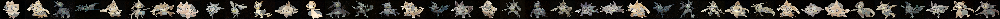

In [8]:
#from google.colab import files

def random_sample(num_images, scale):
    latents = np.random.RandomState(int(1000*random.random())).randn(num_images, *Gs.input_shapes[0][1:])
    labels = np.zeros([latents.shape[0]] + Gs.input_shapes[1][1:])
    images = Gs.run(latents, None, truncation_psi=truncation, randomize_noise=False, output_transform=fmt)
#     images_ct = np.concatenate([img for img in images], axis=1)
    images_ct = np.concatenate([resize(img, (512, 680)) for img in images], axis=1)
    plt.figure(figsize=(scale*num_images, scale))
    plt.imshow(images_ct)
    plt.axis('off')
    plt.savefig('sgan_sample2.png')
    return images, latents

images, latents = random_sample(40, scale=8)
# images, latents = random_sample(2, scale=8)


# files.download('download.png')

In [39]:
# files.download('gan_result1.png')

generate a movie of latent traversal

In [9]:
import PIL 

In [10]:
latents = get_latent_interpolation(latents, 30, 'linear', False)
labels = np.zeros([latents.shape[0]] + Gs.input_shapes[1][1:])

images = generate_images(latents, labels)    

make_movie(images, '.', 'sgan4') # can change the name of the movie or mp4 from 'sgan4'


Moviepy - Building video sgan4.mp4.
Moviepy - Writing video sgan4.mp4



Moviepy - Done !
Moviepy - video ready sgan4.mp4


ffmpeg command:

`ffmpeg -i frame%05d.png -c:v libx264 -pix_fmt yuv420p sgan.mp4`
